In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_score, recall_score, f1_score

Uploading the dataset

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving waterQuality1.csv to waterQuality1.csv


In [ ]:
# data=pd.read_csv('water_potability.csv')
# data.head(10)
data=pd.read_csv('waterQuality1.csv')
data.head(10)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
5,0.94,14.47,0.03,2.88,0.003,0.80,0.43,1.38,0.11,0.67,...,0.135,9.75,1.89,0.006,27.17,5.42,0.08,0.19,0.02,1
6,2.36,5.6,0.01,1.35,0.004,1.28,0.62,1.88,0.33,0.13,...,0.021,18.60,1.78,0.007,45.34,2.84,0.10,0.24,0.08,0
7,3.93,19.87,0.04,0.66,0.001,6.22,0.10,1.86,0.86,0.16,...,0.197,13.65,1.81,0.001,53.35,7.24,0.08,0.08,0.07,0
8,0.60,24.58,0.01,0.71,0.005,3.14,0.77,1.45,0.98,0.35,...,0.167,14.66,1.84,0.004,23.43,4.99,0.08,0.25,0.08,1
9,0.22,16.76,0.02,1.37,0.007,6.40,0.49,0.82,1.24,0.83,...,0.109,4.79,1.46,0.010,30.42,0.08,0.03,0.31,0.01,1


Dataset Analysis

In [ ]:
data.shape

(7999, 21)

In [ ]:
data.isnull().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

In [ ]:
data['ammonia'] = pd.to_numeric(data['ammonia'], errors='coerce')

In [ ]:
data['ammonia'].isnull().sum()

3

In [ ]:
data.dropna(subset=['ammonia'], inplace=True)

In [ ]:
data['is_safe'] = pd.to_numeric(data['is_safe'], errors='coerce')
data['is_safe'].isnull().sum()

0

In [ ]:
data.describe()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,...,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,14.278212,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,...,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672,0.114057
std,1.265323,8.878930,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,...,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906,0.317900
min,0.000000,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,6.577500,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,...,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,0.070000,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,...,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,0.280000,22.132500,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,...,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000,0.000000
max,5.050000,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,...,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


In [ ]:
# data.fillna(data.mean(), inplace=True)

In [ ]:
data.isnull().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

In [ ]:
# data.Potability.value_counts()
data.is_safe.value_counts()

0    7084
1     912
Name: is_safe, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


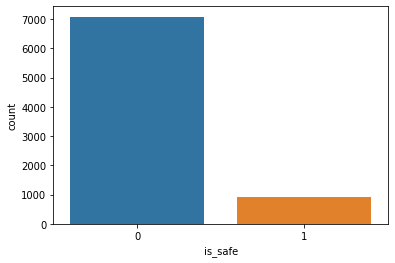

In [ ]:
# sns.countplot(data['Potability'])
# plt.show()
sns.countplot(data['is_safe'])
plt.show()

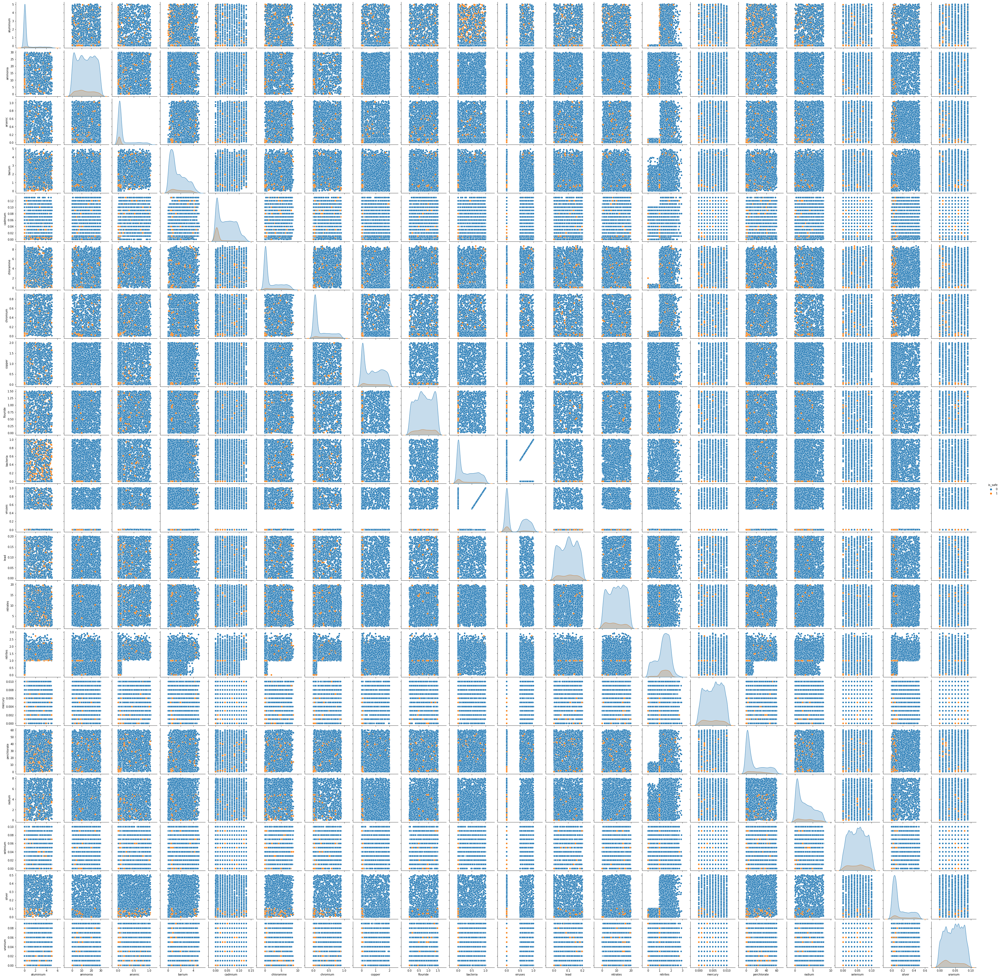

In [ ]:
sns.pairplot(data, hue='is_safe')
plt.show()

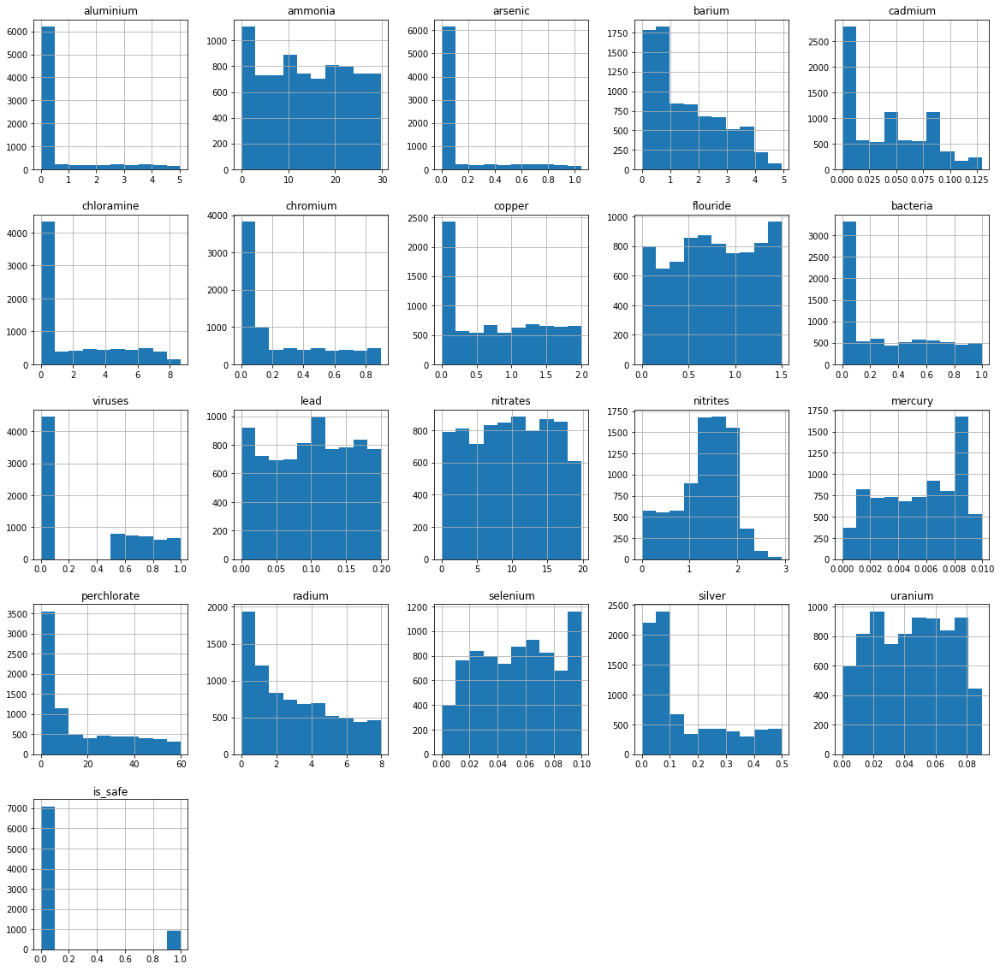

In [ ]:
data.hist(figsize = (20, 20))
plt.show()

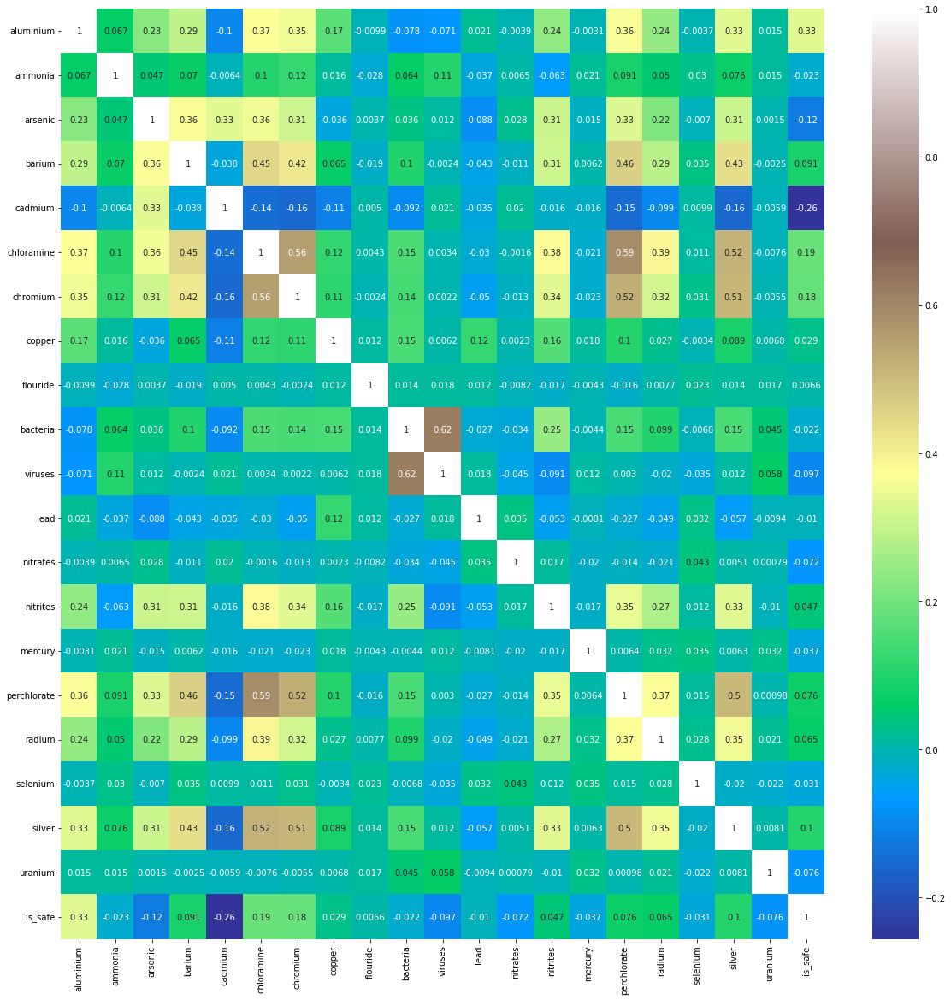

In [ ]:
plt.figure(figsize = (20, 20))
sns.heatmap(data.corr(), annot = True, cmap = "terrain")
plt.show()

In [ ]:
# X = data.drop('Potability',axis=1)
# Y= data['Potability']
X = data.drop('is_safe',axis=1)
Y= data['is_safe']

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size= 0.2, random_state=1)

Installing TPOT (AutoML Library)

Handling class imbalance using data oversampling Sampling the training data. We will oversampling to increase the number of samples of the minority class. Here, the method used is: SMOTE oversampling.

In [ ]:
!pip install -U imbalanced-learn

     |████████████████████████████████| 199 kB 4.8 MB/s 
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.8.1
    Uninstalling imbalanced-learn-0.8.1:
      Successfully uninstalled imbalanced-learn-0.8.1


In [ ]:
from imblearn.over_sampling import RandomOverSampler, SMOTE, BorderlineSMOTE
from imblearn.under_sampling import EditedNearestNeighbours

In [ ]:
ros = SMOTE(random_state=100) # uncomment for oversampling using SMOTE
X_bl, Y_bl = ros.fit_resample(X, Y)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


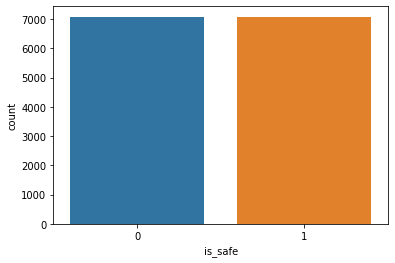

In [ ]:
sns.countplot(Y_bl)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


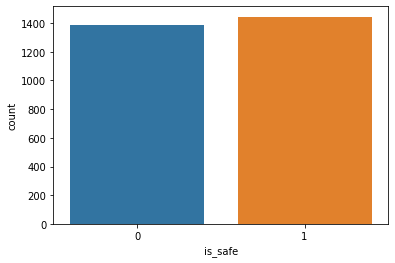

In [ ]:
X_train_bl, X_test_bl, Y_train_bl, Y_test_bl = train_test_split(X_bl,Y_bl, test_size= 0.2, random_state=1)
sns.countplot(Y_test_bl)
plt.show()

In [ ]:
!pip install tpot

     |████████████████████████████████| 87 kB 3.0 MB/s 
     |████████████████████████████████| 173.6 MB 7.5 kB/s 
     |████████████████████████████████| 160 kB 66.6 MB/s 
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11956 sha256=2374c8c229773631b1a7bce699057a2a355cb0cd9dafc0275880b0854d3bbbcb
  Stored in directory: /root/.cache/pip/wheels/e2/d2/79/eaf81edb391e27c87f51b8ef901ecc85a5363dc96b8b8d71e3
Successfully built stopit
  Attempting uninstall: xgboost
    Found existing installation: xgboost 0.90
    Uninstalling xgboost-0.90:
      Successfully uninstalled xgboost-0.90


In [ ]:
from tpot import TPOTClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
#from sklearn.model_selection import ShuffleSplit

In [ ]:
KFold = RepeatedStratifiedKFold(n_repeats=3, random_state=1)
#cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=0)

In [ ]:
tpot_model = TPOTClassifier(generations=5, population_size=50, cv=KFold, scoring='accuracy', verbosity=2, random_state=1, n_jobs=-1)

In [ ]:
tpot_model.fit(X_train_bl, Y_train_bl)

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9748250640156885

Generation 2 - Current best internal CV score: 0.979765760525586

Generation 3 - Current best internal CV score: 0.979765760525586

Generation 4 - Current best internal CV score: 0.979765760525586

Generation 5 - Current best internal CV score: 0.9810599993537112

Best pipeline: SGDClassifier(ExtraTreesClassifier(GradientBoostingClassifier(GaussianNB(input_matrix), learning_rate=0.5, max_depth=9, max_features=0.7500000000000001, min_samples_leaf=2, min_samples_split=7, n_estimators=100, subsample=0.9000000000000001), bootstrap=False, criterion=gini, max_features=0.6500000000000001, min_samples_leaf=3, min_samples_split=19, n_estimators=100), alpha=0.0, eta0=0.1, fit_intercept=False, l1_ratio=0.0, learning_rate=constant, loss=squared_hinge, penalty=elasticnet, power_t=0.0)


TPOTClassifier(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=1),
               generations=5, n_jobs=-1, population_size=50, random_state=1,
               scoring='accuracy', verbosity=2)

In [ ]:
prediction=tpot_model.predict(X_test_bl)
tpot_model.score(X_test_bl, Y_test_bl)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"


0.981651376146789

Accuracy Score = 98.1651376146789
Confusion Matrix =



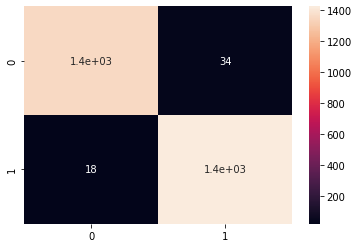

Classification Report =
               precision    recall  f1-score   support

           0       0.99      0.98      0.98      1390
           1       0.98      0.99      0.98      1444

    accuracy                           0.98      2834
   macro avg       0.98      0.98      0.98      2834
weighted avg       0.98      0.98      0.98      2834



In [ ]:
print(f"Accuracy Score = {accuracy_score(Y_test_bl,prediction)*100}")
print("Confusion Matrix =\n")
sns.heatmap(confusion_matrix(Y_test_bl,prediction), annot=True)
plt.show()
print(f"Classification Report =\n {classification_report(Y_test_bl,prediction)}")

In [ ]:
!pip install autokeras

     |████████████████████████████████| 160 kB 5.1 MB/s 
     |████████████████████████████████| 133 kB 48.4 MB/s 
     |████████████████████████████████| 462 kB 52.3 MB/s 


Autokeras (Auto DL Library)

In [ ]:
import autokeras as ak
import tensorflow as tf
from tensorflow import keras

In [ ]:
X_train_bl, X_val_bl, Y_train_bl, Y_val_bl = train_test_split(X_train_bl, Y_train_bl, test_size=0.2, random_state=1)
autokeras_model = ak.StructuredDataClassifier(overwrite=True, max_trials=1)
model_history = autokeras_model.fit(X_train_bl, Y_train_bl, epochs=50, batch_size=1, validation_data=(X_val_bl, Y_val_bl))

Trial 1 Complete [00h 08m 29s]
val_accuracy: 0.9439788460731506

Best val_accuracy So Far: 0.9439788460731506
Total elapsed time: 00h 08m 29s
INFO:tensorflow:Oracle triggered exit
Epoch 1/50
9067/9067 [==============================] - 27s 3ms/step - loss: 0.2936 - accuracy: 0.8709 - val_loss: 0.2177 - val_accuracy: 0.9082
Epoch 2/50
9067/9067 [==============================] - 27s 3ms/step - loss: 0.1770 - accuracy: 0.9261 - val_loss: 0.1832 - val_accuracy: 0.9241
Epoch 3/50
9067/9067 [==============================] - 27s 3ms/step - loss: 0.1448 - accuracy: 0.9414 - val_loss: 0.1751 - val_accuracy: 0.9277
Epoch 4/50
9067/9067 [==============================] - 26s 3ms/step - loss: 0.1275 - accuracy: 0.9489 - val_loss: 0.1707 - val_accuracy: 0.9334
Epoch 5/50
9067/9067 [==============================] - 23s 3ms/step - loss: 0.1143 - accuracy: 0.9545 - val_loss: 0.1606 - val_accuracy: 0.9365
Epoch 6/50
9067/9067 [==============================] - 26s 3ms/step - loss: 0.1042 - accuracy:

In [ ]:
Y_predicted = autokeras_model.predict(X_test_bl)
print(autokeras_model.evaluate(X_test_bl, Y_test_bl))

89/89 [==============================] - 0s 2ms/step - loss: 0.2766 - accuracy: 0.9531
[0.2765647768974304, 0.9530698657035828]


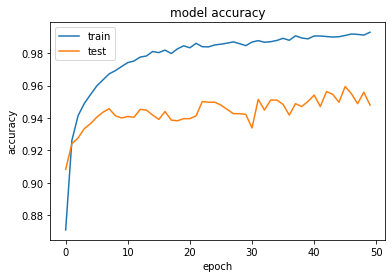

In [ ]:
# summarize history for accuracy
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

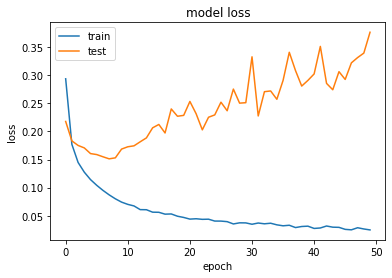

In [ ]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

Accuracy Score = 95.30698659139027
Confusion Matrix =



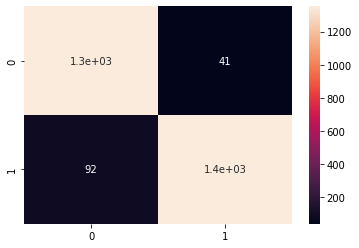

Classification Report =
               precision    recall  f1-score   support

           0       0.94      0.97      0.95      1390
           1       0.97      0.94      0.95      1444

    accuracy                           0.95      2834
   macro avg       0.95      0.95      0.95      2834
weighted avg       0.95      0.95      0.95      2834



In [ ]:
print(f"Accuracy Score = {accuracy_score(Y_test_bl,Y_predicted)*100}")
print("Confusion Matrix =\n")
sns.heatmap(confusion_matrix(Y_test_bl,Y_predicted), annot=True)
plt.show()
print(f"Classification Report =\n {classification_report(Y_test_bl,Y_predicted)}")